## Notebook overview
This notebook builds the basis of the figures in
* Fig. 4A
* Fig. 4B
* Fig. 4C
* Fig. 4D
* Fig. S13
* Fig. S14
* Fig. S15
* Fig. S16

From Moses *et al.* (1)

[Moses, D., Yu, F., Ginell, G., Shamoon, N.M., Koenig, P.S., Holehouse, A.S., and Sukenik, S. (2020). Probing the Hidden Sensitivity of Intrinsically Disordered Proteins to their Chemical Environment.](https://www.biorxiv.org/content/10.1101/2020.08.17.252478v1)



In [1]:
import numpy as np
import matplotlib.pyplot as plt
import random
from collections.abc import Iterable
from matplotlib.pyplot import figure
import matplotlib
import analytical_model

# Set such that PDF fonts export in a manner that they
# are editable in illustrator/affinity
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

# set to define axes linewidths
matplotlib.rcParams['axes.linewidth'] = 0.5

# this defines some prefactors so inline figures look nice
# on a retina macbook. These can be commented out without any
# issue and are solely asthetic.
%matplotlib inline
%config InlineBackend.figure_format='retina'

# this number is the actual value used in the PIMMS simulations
# for bead-bead interaction strengths and is used to calculate 
# interaction strengths in kT (where k=1). This should not be 
# changed
PIMMS_INTERACTION_STRENGTH = -30

# This is equivalent to the SOLUTE_SOLVENT strength for a model where chain-chain interaction
# is 0. We compute this value 
PIMMS_SOLUTE_SOLVENT_STRENGTH = -1*(PIMMS_INTERACTION_STRENGTH/2)
INTRACHAIN2CHAINSOLVENT_SCALAR = PIMMS_SOLUTE_SOLVENT_STRENGTH/PIMMS_INTERACTION_STRENGTH

# This number provides the lengthscale upon which Rg and Re are
# reported in. The base lengthscale is reported for Rg but can be
# converted to Re under a Gaussian model assumption of a fixed
# Rg->Re relationship as defined by Re = Rg*sqrt(6). For a homopolymer
# this is a reasonable conversion factor (although it becomes) increasingly
# ungood as chains become increasingly heteropolymer, see also
#
# Fuertes, G., Banterle, N., Ruff, K. M., Chowdhury, A., Mercadante, D., Koehler, C., 
# Kachala, M., Estrada Girona, G., Milles, S., Mishra, A., Onck, P. R., Gräter, F., 
# Esteban-Martín, S., Pappu, R. V., Svergun, D. I. & Lemke, E. A. Decoupling of 
# size and shape fluctuations in heteropolymeric sequences reconciles discrepancies 
# in SAXS vs. FRET measurements. Proc. Natl. Acad. Sci. U. S. A. 114, E6342–E6351 (2017).
RG_PREFACTOR = 0.5

# define the mode to be used (can be 'RE' or 'RG')
R = 'RE' 
if R =='RG':
    PREFACTOR = RG_PREFACTOR
elif R=='RE':
    PREFACTOR = RG_PREFACTOR*np.sqrt(6)
else:
    raise Exception('"R" must be either RG or RE')
    

def plot_figure(chi, expand, contract, savename=None, alpha=0.2, markersize=40, xlim=[-0.6, 0.6]):
    """
    Function that plots chi vs. delta chi (expand/contract) in a consistent way
    with consistent boundaires.
    
    chi, expand, contract should be lists or np.arrays that are the same length as
    one another
    
    Parameters:
    
    chi : list or 1D np.array
        Set of values corresponding to chi values (x axis) of figure
    
    """
    
    figure(num=None, figsize=(5, 4), dpi=300, facecolor='w', edgecolor='k')
    # plot the data
    plt.scatter(chi, contract, s=markersize, c='blue', alpha=alpha)
    plt.scatter(chi, expand, s=markersize, c='red', alpha=alpha)
    
    # define xlabel and y label
    ax = plt.gca()
    ax.set_xlabel(r'$\chi$', fontsize=14)
    ax.set_ylabel(r'$\Delta \chi$',fontsize=14)

    # plot dashed lines at 0,0 in both axes
    plt.plot([xlim[0], xlim[1]],[0,0],'--k', linewidth=0.5)
    plt.plot([0.0, 0.0],[-1,1],'--k', linewidth=0.5)
    
    # set standard limits for x and y
    plt.xlim([xlim[0], xlim[1]])
    plt.ylim([-1.0,1.0])
    plt.tight_layout()

    # if we wave to save, save the file
    if savename:
        plt.savefig('%s'%(savename))
    


## STEP 1: Load in polymer data
First thing is to read in the length-dependent homopolymer data run from PIMMS which we're going to use to parameterize the analytical model

In [2]:
indir='data/homopolymer'
data = {}

# read in homopolymer RG values of different lengths
for L in [50, 80, 120, 200, 300, 400, 500]:
    data[L] = np.loadtxt('%s/L_%i.csv'%(indir,L), delimiter=', ')

# also read in 100 which has a slightly different name/format
L = 100
data[L] = np.loadtxt('%s/L_%i_full.csv'%(indir,L), delimiter=', ')

# define all lengths we're going to use for fitting
all_lengths = [50, 80,100, 120, 200, 300, 400, 500];



## Model parameterization
The cell below parameterizes the two parameters in our analytical model by matching against homopolymer simulations. In effect, these two parameters actually report on the chain stiffness/thickness and the alence of each bead, which are the two factors that dictate the length-dependence of the coil-to-globule transition in a homopolymer. 

Note that there are underlying assumptions baked into this approach such that we necessarily need this to be a homopolymer model (notably RG/RE conversion). This could be extended to a heteropolymer model, but to do so rederivation of the analytical form and direct parameterization on the parameter of interest would be necesseray.

In [3]:

all_vals = []
print('Model parameterization starting! This will take a couple of minutes...')
for IDX in range(len(all_lengths)):
    
    L = all_lengths[IDX]
    
    print('On homopolymer length %i'%(L))
        
    # compute nu values for the radii of gyration
    nuvals = analytical_model.rg2nu(data[L].transpose()[1], L, RG_PREFACTOR)
    
    # compute chi values from the nu values
    chivals = analytical_model.nu2chi(nuvals, L)
    
    # computer normalized interaction strength for each value (bead strength divided by T)
    intervals = PIMMS_INTERACTION_STRENGTH/data[L].transpose()[0];
            
    # define range for theta and m- parameters we're going to search over
    theta_range = np.arange(-1,-6,-0.01)
    m_range = np.arange(-0.01,-0.1,-0.001)
    
    # iteratively fit over the range by brute force
    best = [1000, 0, 0]
    for t in theta_range:
        for m in m_range:

            # calculate the analytical chi value from the passed interaction energies for a chain
            # of length L
            calc_chi = analytical_model.energytochi(intervals, L, RG_PREFACTOR, theta=t, midpoint=m)
            
            # compute distance from calculated from real chi vals
            v = np.sum(np.power(calc_chi-chivals, 2))
            
            if v < best[0]:
                best = [v, t, m]
    all_vals.append(best)

params_theta = np.array(all_vals).transpose()[1]
params_m = np.array(all_vals).transpose()[2]
print('Model parameterization complete!')


Model parameterization starting! This will take a couple of minutes...
On homopolymer length 50
On homopolymer length 80
On homopolymer length 100
On homopolymer length 120
On homopolymer length 200
On homopolymer length 300
On homopolymer length 400
On homopolymer length 500
Model parameterization complete!


## Code to fit for the $\theta$ parameter  (Fig. S13A)
Defines a powerlaw function that fites for the  length-dependent coil-to-globule transitionNext we use scipy to fit for the theta (cooperativity) and m (midpoint) equations. These are parameters that are used inside exponential models that relate chain length to the cooperativity and midpoint. Both cooperativity and midpoint show an exponential dependence on chain length, so we leverage that to identify parameters that let us convert chain length into theta and m

Best fit theta function params: -log(L)*0.6077 -0.1800


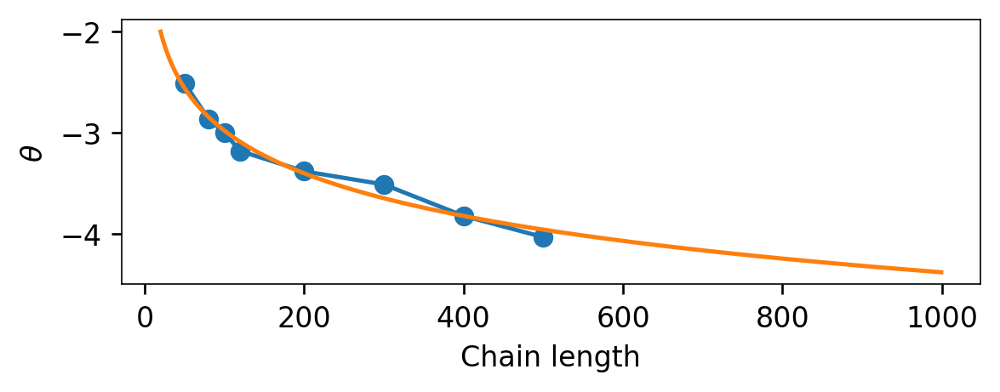

In [5]:
## Fit params
from scipy.optimize import curve_fit

## function that fits for the midpoint value 
def exp_func(x, a, b):
    """
    x is the length and a and b are fixed parameters we're fitting for. 
    
    """
    return -np.log(x)*a + b

# optimized curve fitting with dogbox as the optimizer
popt, pcov = curve_fit(exp_func, np.array(all_lengths), params_theta, method='dogbox')


## Plot the best fitting values
figure(num=None, figsize=(5, 2), dpi=120, facecolor='w', edgecolor='k')
plt.plot(all_lengths, params_theta,'o-')
lr = np.arange(20,1000,1)
plt.plot(lr, exp_func(lr,popt[0],popt[1]))
plt.xlabel('Chain length')
plt.ylabel(r'$\theta$')

best_theta_1 = popt[0]
best_theta_2 = popt[1]
print('Best fit theta function params: -log(L)*%1.4f %1.4f'%(best_theta_1, best_theta_2))
plt.tight_layout()

plt.savefig('figures/FIG_S13A.pdf')

## Code to fit for the midpoint parameter  (Fig. S13B)
Defines a powerlaw function that fites for the  length-dependent coil-to-globule transition

Best fit midpoint function: [-0.27382947]


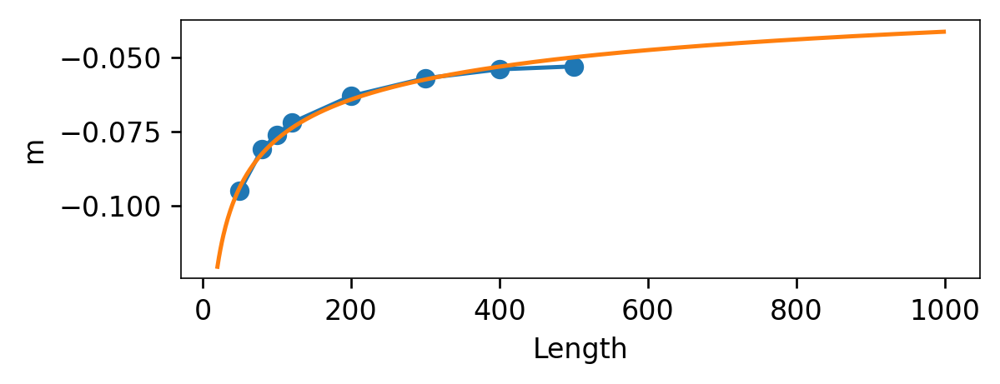

In [6]:
## function that fits for the cooperativity parameter
def powerlaw(x, a):
    """
    x is chain length and a is parameter we're fitting for
    """
    
    return a*np.power(x,a)

# optimized curve fitting with dogbox as the optimizer
popt2, pcov = curve_fit(powerlaw, np.array(all_lengths), params_m)

best_mid = popt2[0]

print('Best fit midpoint function: %s'%(str(popt2)))

figure(num=None, figsize=(5, 2), dpi=120, facecolor='w', edgecolor='k')
plt.plot(all_lengths, params_m,'o-')
lr = np.arange(20,1000,1)
plt.plot(lr, powerlaw(lr,best_mid))
plt.xlabel('Length')
plt.ylabel(r'm')
plt.tight_layout()

plt.savefig('figures/FIG_S13B.pdf')


## Plot $R_e$ vs. $\chi$ (Fig. S16)

The next figure is a simple calibration of how the end-to-end distance ($R_e$) (or, truthfully, the radius of gyration ($R_g$)) scales with length as a function of $\chi$. The lengthscale here comes from the `PREFACTOR` variable, which basically defines a lengthscale according to the polymeric relationship

$R_e = BN^{\nu}$

Where

* $R_e$ = end-to-end distance
* $B$ = `PREFACTOR`
* $\nu$ = apparent scaling exponent

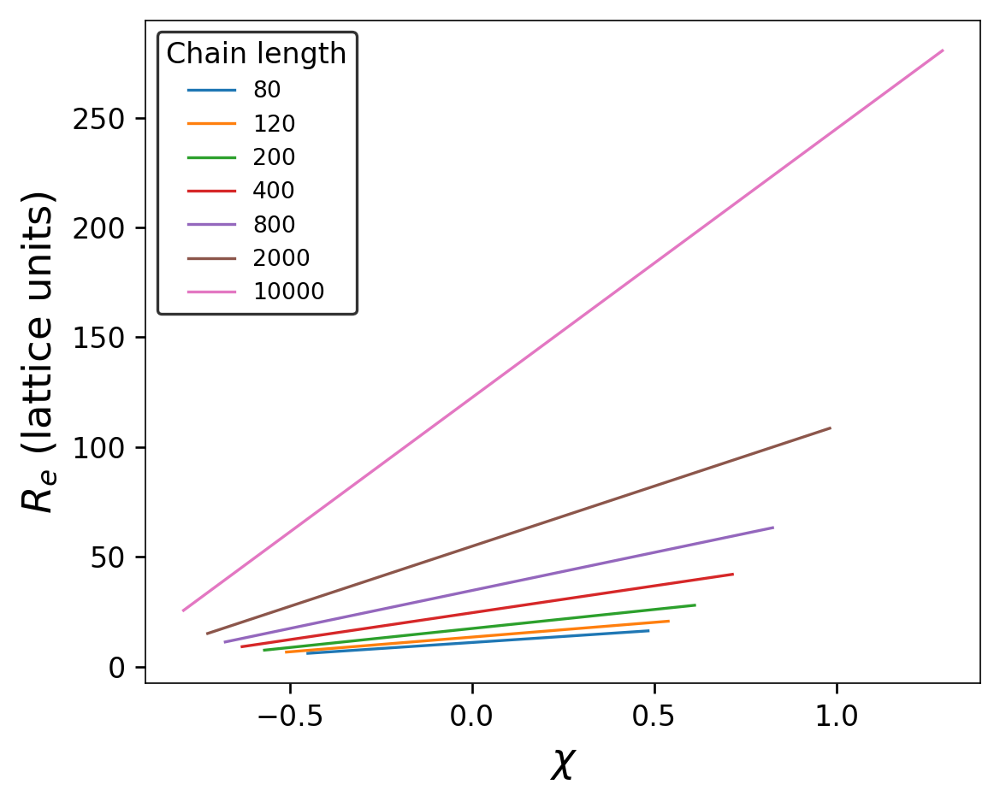

In [8]:
energy_vals = np.arange(-0.2, 0,0.001)

L_demo = [80,120,200,400,800,2000,10000]

figure(num=None, figsize=(5, 4), dpi=120, facecolor='w', edgecolor='k')

for L in L_demo:

    local_chi = analytical_model.energytochi(energy_vals, L, PREFACTOR)
    local_rX  = analytical_model.chi2rg(np.array(local_chi), L, PREFACTOR)
    
    plt.plot(local_chi, local_rX, linewidth=1)

plt.legend(L_demo, loc='upper left', edgecolor='k',fontsize=8, title='Chain length')

plt.xlabel(r'$\chi$', fontsize=14)
plt.ylabel('$R_e$ (lattice units)', fontsize=14)
plt.savefig('figures/FIG_S16.pdf')
plt.tight_layout()


## Plot $\chi$ vs. inter-chain or chain-solvent interaction strength (Fig.  S15)

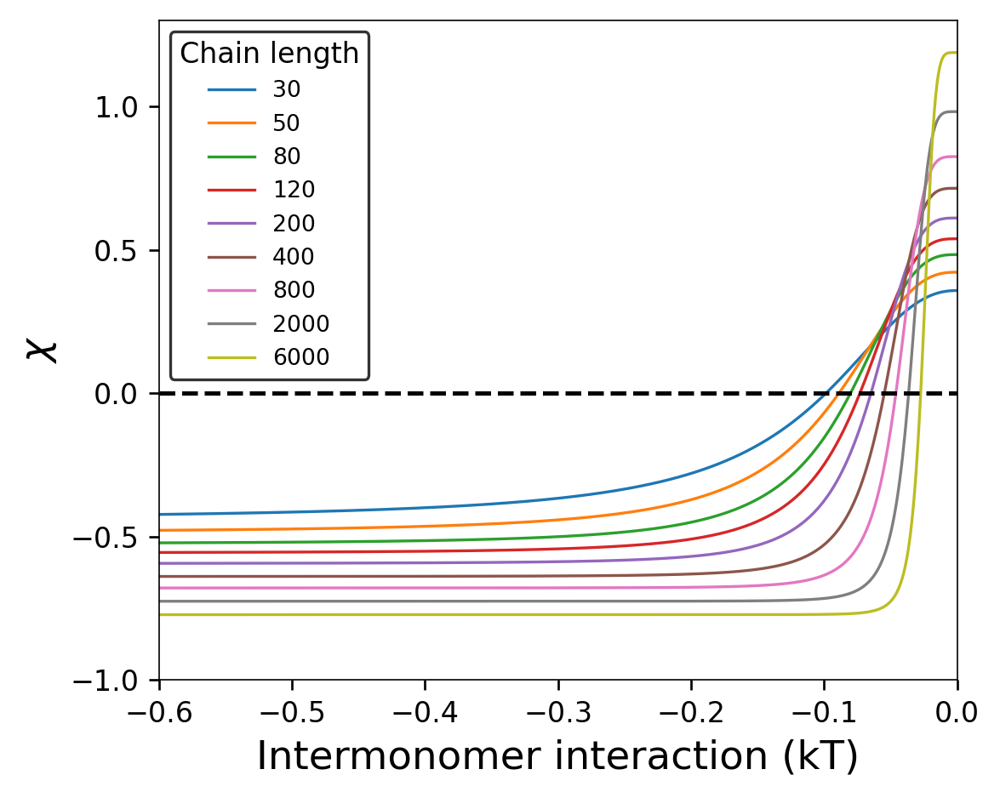

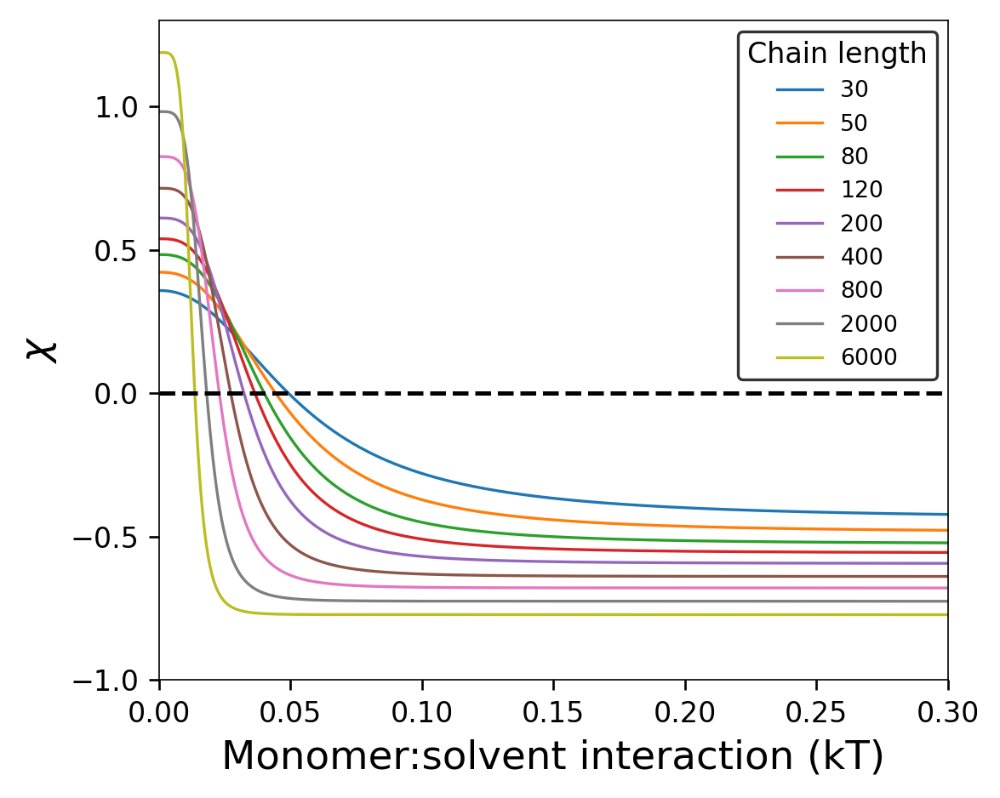

In [9]:
energy_vals = np.arange(-0.6,0.1,0.001)

L_demo = [30, 50, 80,120,200,400,800,2000,6000]

for energy_scalar in [1,INTRACHAIN2CHAINSOLVENT_SCALAR]:

    figure(num=None, figsize=(5, 4), dpi=120, facecolor='w', edgecolor='k')

    if energy_scalar == 1:
        xmin = -0.6
        xmax = 0.0
        legend_loc='upper left'
        pannel_number='A'
        xname = 'Intermonomer interaction (kT)'
    else:
        xmin = 0.0
        xmax = 0.3
        legend_loc='upper right'
        pannel_number='B'
        xname = 'Monomer:solvent interaction (kT)'


    for L in L_demo:    
        a = analytical_model.energytochi(energy_vals, L, PREFACTOR)
        plt.plot(energy_vals*energy_scalar, a, linewidth=1)
        
    plt.legend(L_demo, loc=legend_loc, edgecolor='k',fontsize=8, title='Chain length')

    plt.xlabel(xname,fontsize=14)
    plt.ylabel(r'$\chi$', fontsize=14)
    plt.xlim([xmin, xmax])
    
    plt.ylim([-1, 1.3])
    plt.plot([xmin, xmax],[0,0],'--k')
    plt.tight_layout()

    plt.savefig('figures/FIG_S15_%s.pdf'%(pannel_number))



## Plot $\chi$ vs. inter-chain or chain-solvent interaction strength (Fig.  S14)
Fit against homopolymer simulations from PIMMS

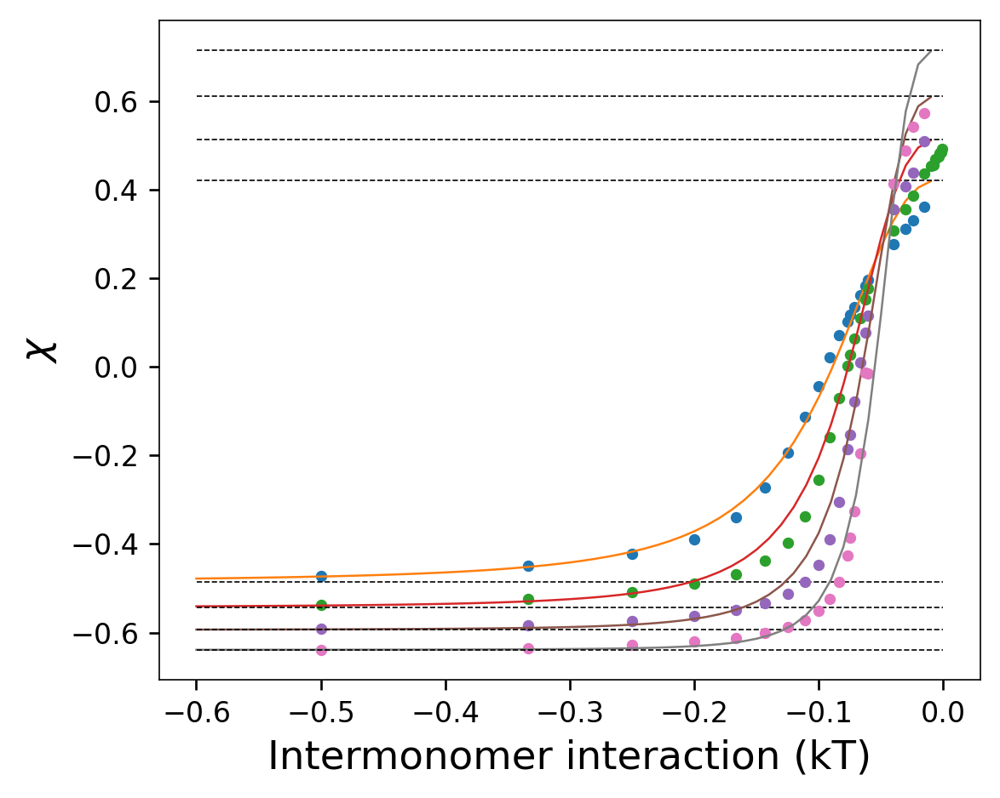

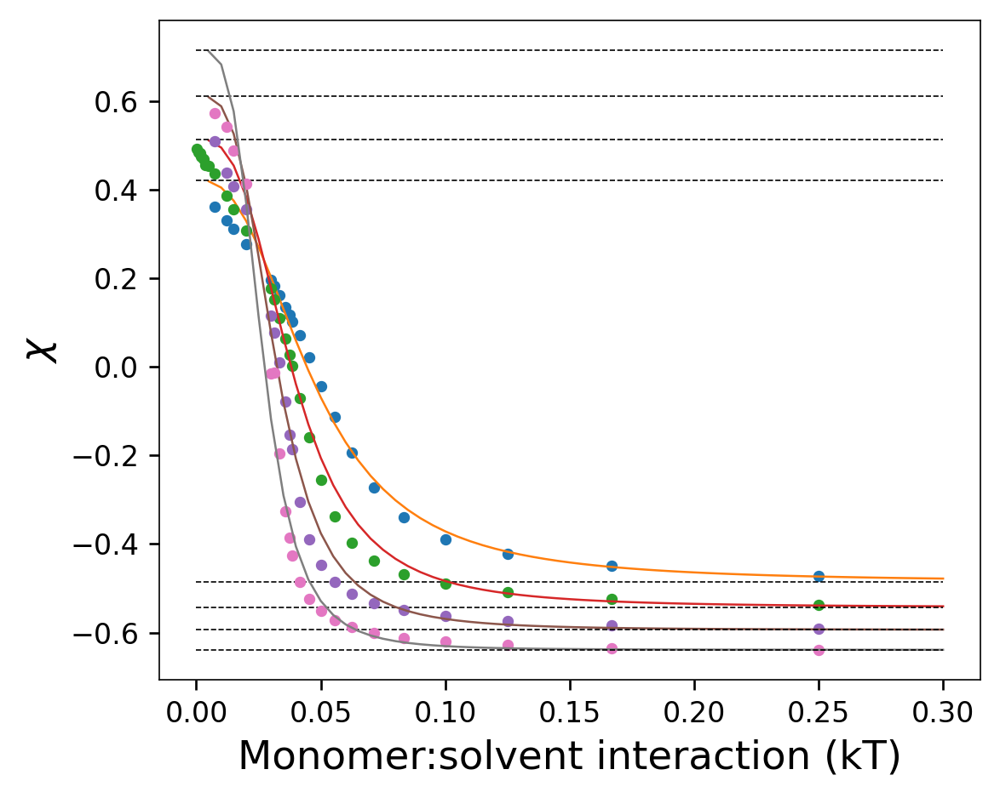

In [10]:
energy_vals = np.arange(-0.6,0,0.01)

for energy_scalar in [1,INTRACHAIN2CHAINSOLVENT_SCALAR]:
    figure(num=None, figsize=(5, 4), dpi=120, facecolor='w', edgecolor='k')
    
    if energy_scalar == 1:
        xmin = -0.6
        xmax = 0.0
        legend_loc='upper left'
        pannel_number='A'
        xname = 'Intermonomer interaction (kT)'
    else:
        xmin = 0.0
        xmax = 0.3
        legend_loc='upper right'
        pannel_number='B'
        xname = 'Monomer:solvent interaction (kT)'

    # indices
    for i in [0,2,4,6]:
        
        # get chain lengths
        L = all_lengths[i]        
        nuvals = analytical_model.rg2nu(data[L].transpose()[1], L, RG_PREFACTOR)

    
        chivals = analytical_model.nu2chi(nuvals, L)
    
        intervals = PIMMS_INTERACTION_STRENGTH/data[L].transpose()[0];
    
        plt.plot(intervals*energy_scalar, chivals,'.')
        plt.plot(energy_vals*energy_scalar, analytical_model.energytochi(energy_vals, L, RG_PREFACTOR),'-', linewidth=0.75)
    
        plt.plot([xmin, xmax], 2*[analytical_model.nu2chi(0.33, L)],'--',linewidth=0.5,color='k')
        plt.plot([xmin, xmax], 2*[analytical_model.nu2chi(0.59, L)],'--',linewidth=0.5,color='k')

    
        plt.xlabel(xname,fontsize=14)
        plt.ylabel(r'$\chi$', fontsize=14)
        plt.tight_layout()


        plt.savefig('figures/FIG_S14_%s.pdf'%(pannel_number))

## Generate $\chi$ vs chain:solvent interaction (Fig. 4D)
Annotations on the figure were done as post-figure edits!

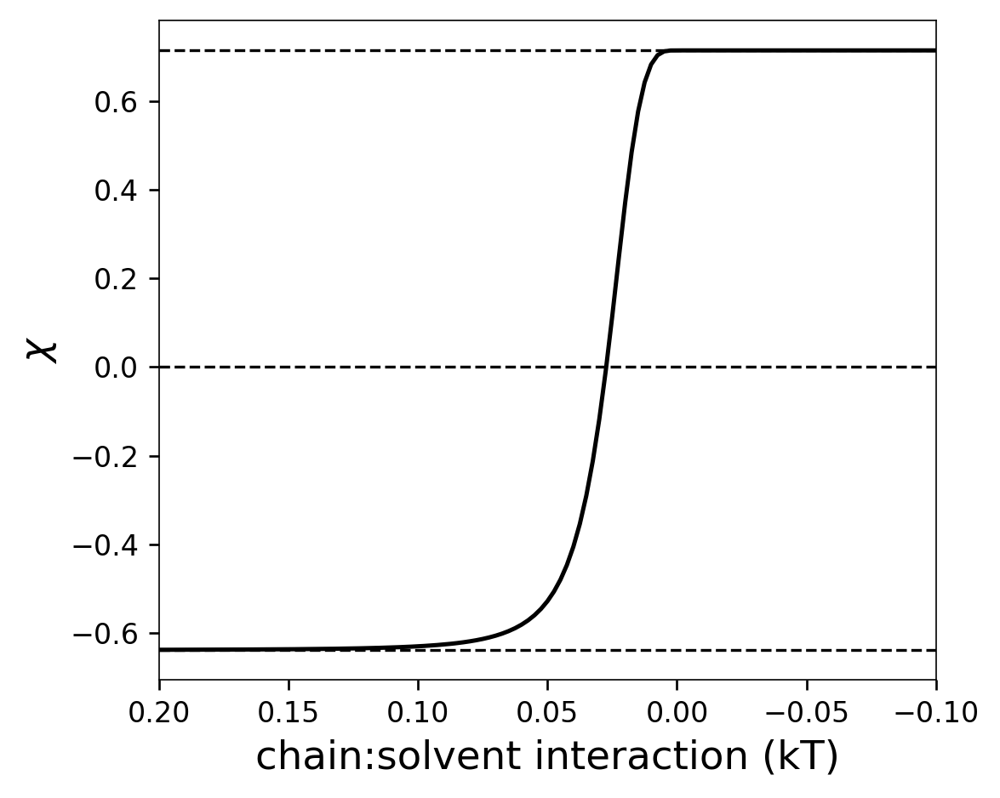

In [11]:
energy_vals = np.arange(-0.6,0.5,0.005)

fig, ax = plt.subplots(figsize=(5, 4), dpi=120, facecolor='w', edgecolor='k')

local_energy_data_4d = energy_vals*INTRACHAIN2CHAINSOLVENT_SCALAR
local_chi_values_4d = analytical_model.energytochi(energy_vals, L, RG_PREFACTOR)

ax.plot(local_energy_data_4d, local_chi_values_4d,'-', linewidth=1.5, color='k')
ax.set_xlim(0.2, -0.1)  # decreasing time
plt.plot([0.2, -0.1], 2*[analytical_model.nu2chi(0.33, L)],'--',linewidth=1,color='k')
plt.plot([0.2, -0.1], 2*[analytical_model.nu2chi(0.5, L)],'--',linewidth=1,color='k')
plt.plot([0.2, -0.1], 2*[analytical_model.nu2chi(0.59, L)],'--',linewidth=1,color='k')

plt.xlabel('chain:solvent interaction (kT)',fontsize=14)
plt.ylabel(r'$\chi$', fontsize=14)
plt.tight_layout()
plt.savefig('figures/FIG_4D.pdf')

## Functions for building sampled contour maps
The following functions let us build synthetic data to explore what the delta-chi vs chi space looks like as a fucntion of perturbation of chain-chain interactions. These functions

In [12]:
####################################################################################
#
def chiperturb(chi, L, delta, local_prefactor):
    """
    Function that generates synthetically perturbed data.
    
    Parameters
    ------------
    chi : list or np.array
        Set of chi values for a collection of sequences
        
    L : int
        Length of sequences being worked with. Requires all sequences pased
        in terms of chi values are the same length.
        
    delta : float
        Change in interaction strength to be applied to each sequence. Will be booth
        added and subtracted symmetrically, such that the intrinsic bead-bead interaction
        strength that corresponds to a given chi value will be perturbed by some fixed amount.
        This is analagous to change the solution environment by some fixed value, modulate the 
        chain-chain interaction strength in the process.
        
    local_prefactor : float
        Prefactor to be passed for converting between energy/chi/nu and dimensions. The prefactor
        basically determines if we end up working in Rg or Re units. Note that in general the preactor
        will actually cancel out, but we pass it in IN CASE later implementations want to do something
        with this prefactor.
    
    
    Returns
    --------
    
    list
        Returns a three-tuple list
        
        [0] = chi valus for all the data passed in. This is actually the same
              as the chi value passed as parameter but is provided again to make
              plotting simple
              
        [1] = delta chi expanion - the per-sequence delta chi value for expansion
        [2] = delta chi contraction - the per-sequence delta chi value for contraction
              (will always be a negative number by defition)
    
    """
    
    # convert chi 2 energy
    e = analytical_model.chitoenergy(chi, L, local_prefactor)
    
    # convert chi to rg (i.e. rg in buffer)
    rg = analytical_model.chi2rg(chi, L, local_prefactor)
    rg_theta = analytical_model.nu2rg(0.5, L, local_prefactor)
    
    # compute new chi after a change in interaction energy caused by solvent
    chi_expand = analytical_model.energytochi(e+delta,L,local_prefactor)
    chi_contract = analytical_model.energytochi(e-delta,L,local_prefactor)
    
    # compute expanded rg/contracted and subtract off original rg to get an amplitude
    # of expansion/contraction in spatial dimensions (positive = expansion, negative = contraction)
    amp_expand   = analytical_model.chi2rg(chi_expand, L, local_prefactor)-rg
    amp_contract = analytical_model.chi2rg(chi_contract, L, local_prefactor)-rg
    
    # finaly return expanded/contracted rg divided by rg at theta 
    return [chi, amp_expand/rg_theta, amp_contract/rg_theta]


def build_dataset(maxdelta, mindelta, delta_range, local_prefactor):
    """
    Function that constructs a collection of data values using a max and min value for the perturbation (delta).
    
    Function that works by scanning over the range of possible chi values with a (stepsize of 0.001) and for each
    chi value scanning overa range of perturbations from $maxdelta to $mindelta with a delta stepsize of delta_range.
    For each perturbation, the delta chi value is calculated
    
    Parameters
    -------------
    maxdelta : float
       Maximum possible + value to interaction energy
       
    mindelta : float
        Minimum possible + value to interaction energy
    
    delta_range :  float
        Stepsize across delta from min to max used
        
    local_prefactor : float
        Prefactor to be passed for converting between energy/chi/nu and dimensions. The prefactor
        basically determines if we end up working in Rg or Re units. Note that in general the preactor
        will actually cancel out, but we pass it in IN CASE later implementations want to do something
        with this prefactor.

    """
    
    
    uniform_data = []
    
    # stepsize over which chi is scanned through 
    chi_stepsize = 0.001

    # for each possible chi v
    for chi in np.arange(analytical_model.nu2chi(0.34, 100), analytical_model.nu2chi(0.59,100), chi_stepsize):
        for delta in np.arange(mindelta, maxdelta, delta_range):
            uniform_data.append(chiperturb(chi, 100, delta, local_prefactor))

    # reshape/restruction into a numpy array
    ds1 = np.array([np.transpose(uniform_data)[0], np.transpose(uniform_data)[1]]).transpose()
    ds2 = np.array([np.transpose(uniform_data)[0], np.transpose(uniform_data)[2]]).transpose()
    uniform_data = np.vstack((ds1,ds2))
    
    # remove NAN values
    uniform_data = uniform_data[~np.isnan(uniform_data).any(axis=1)]
            
    return uniform_data


## Dependence on solvation magnitude (Fig. S6)
The following cell builds a collection of contour maps detailing how the solution-responsive surface varies as a function of the least sensitive and the most sensitive chain in a set of chains.

On 0...
On 1...
On 2...
On 3...


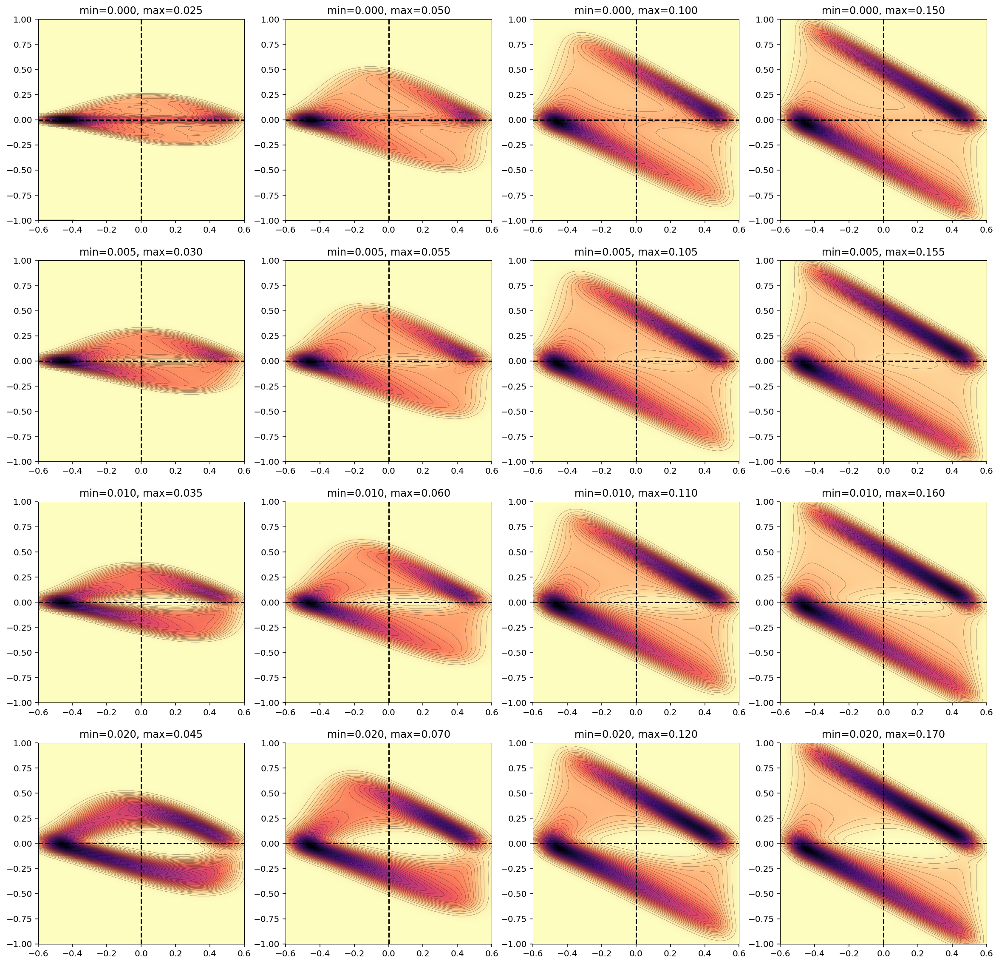

In [13]:
from scipy.stats import kde

nbins = 80
#print(data.shape)

 
mindelta_vector = [0, 0.005, 0.01, 0.02]
maxdelta_vector = [0.025, 0.05, 0.1, 0.15]
delta_range = 0.005

fig, axes = plt.subplots(ncols=len(mindelta_vector), nrows=len(maxdelta_vector), figsize=(20, 20))

x_max = 0.8
x_min = -0.8
y_max = 1.1
y_min = -1.1
local_prefactor = PREFACTOR

for i in range(len(mindelta_vector)):
    print('On %i...'%(i))
    for j in range(len(maxdelta_vector)):
    
        mindelta = mindelta_vector[i]
        maxdelta = mindelta + maxdelta_vector[j]
    
        uniform_data = build_dataset(maxdelta, mindelta, delta_range, local_prefactor)
    
        # Evaluate a gaussian kde on a regular grid of nbins x nbins over data extents
        k = kde.gaussian_kde(uniform_data.T)
        #xi, yi = np.mgrid[x.min():x.max():nbins*1j, y.min():y.max():nbins*1j]
        
        xi, yi = np.mgrid[x_min:x_max:nbins*1j, y_min:y_max:nbins*1j]
        zi = k(np.vstack([xi.flatten(), yi.flatten()]))

 
        # contour
        axes[i,j].set_title('min=%1.3f, max=%1.3f'%(mindelta,maxdelta))
        axes[i,j].pcolormesh(xi, yi, zi.reshape(xi.shape), shading='gouraud', cmap=plt.cm.magma_r)
        axes[i,j].contour(xi, yi, zi.reshape(xi.shape), levels=40, linewidths=0.15, colors='black')
        axes[i,j].set_xlim([-0.6,0.6])
        axes[i,j].set_ylim([-1.0,1.0])
        axes[i,j].plot([-0.6,0.6],[0,0],'--k')
        axes[i,j].plot([0,0],[-1,1],'--k')



plt.savefig('figures/FIG_S6.pdf')  


## Theory $\chi$ vs. $\Delta\chi$ (Fig. 4C)
This next cell constructs a set of synthetic data by titrating over chi and energy difference to mimick changes in chain:solvent interactions

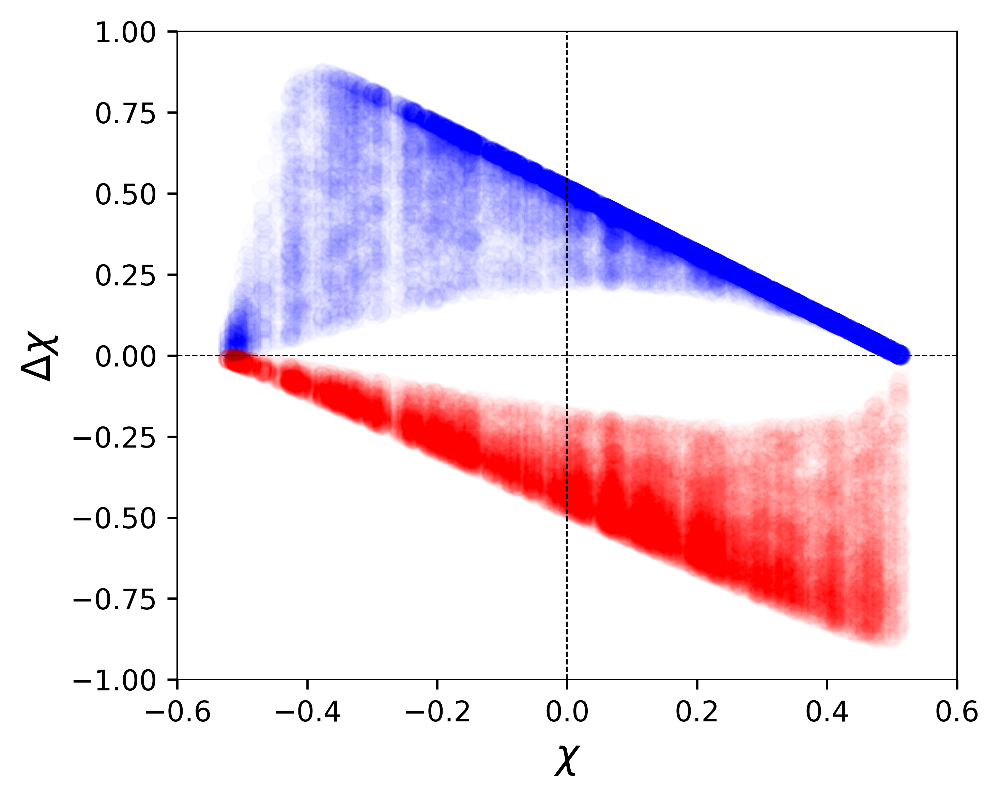

In [14]:
nhits = 800
all_data = []
s = np.random.normal(0.2, 0.4, nhits)
maxdelta = 0.12
mindelta = 0.02
delta_range = 0.014
L=100

for minval in np.arange(mindelta, maxdelta, delta_range):
    for maxval in np.arange(minval+delta_range, maxdelta, delta_range):
        
        d = np.random.default_rng().uniform(minval, maxval, nhits)
        for i in range(len(d)):    
    
            chi = s[i]
            delta = d[i]

            if chi < analytical_model.nu2chi(0.59, L) and chi > analytical_model.nu2chi(0.34, L):
                all_data.append(chiperturb(chi, L, delta, local_prefactor))

all_data = np.array(all_data)

                
chi_local = all_data.transpose()[0]
expand_local = all_data.transpose()[1]
contract_local = all_data.transpose()[2]
    
plot_figure(chi_local, contract_local, expand_local, savename='figures/FIG_4C.png', alpha=0.01, xlim=[-0.6, 0.6])


## $\chi$ vs $\Delta \chi$  for random heterpolymers (Fig. 4C)
First we read in and then plot the randomly generated heteropolymer data from the PIMMS simulations

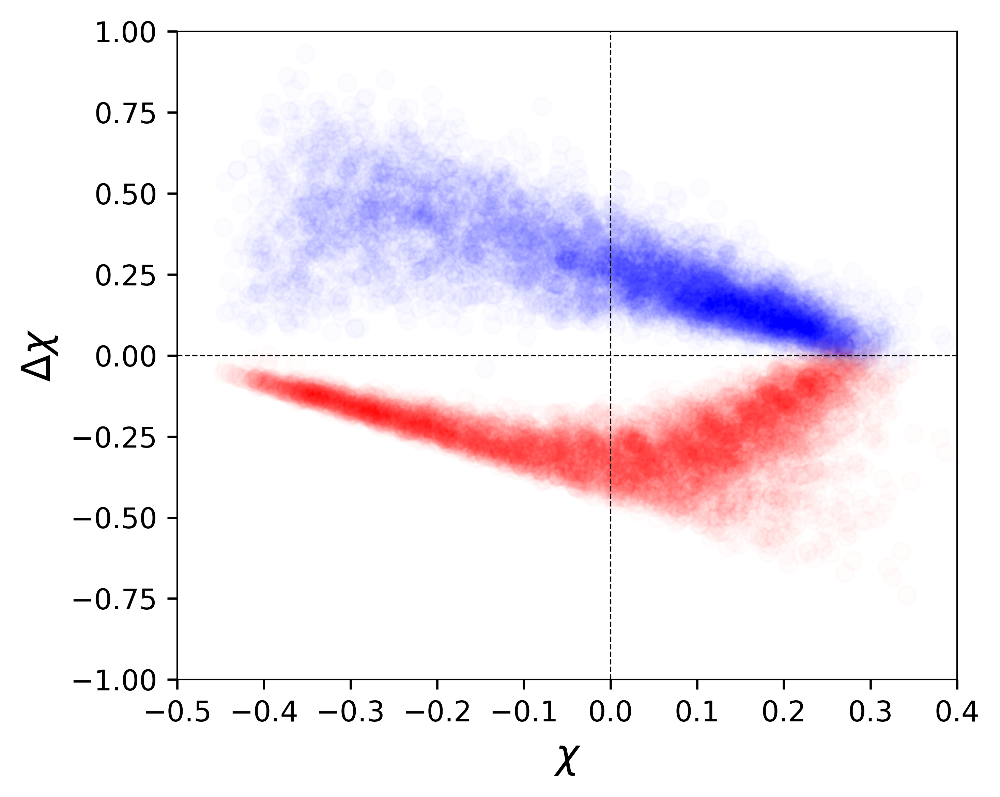

In [16]:

x = np.loadtxt('data/pimms_heterpolymer_chi_con_exp_rg.csv')

chi_REAL = x.transpose()[0]
expand_REAL = x.transpose()[1]
contract_REAL = x.transpose()[2]

plot_figure(chi_REAL, expand_REAL, contract_REAL, savename='figures/FIG_4B.png', alpha=0.01, xlim=[-0.5, 0.4])

## Read in all-atom data
Read in data from all-atom simulations

In [17]:
import pandas as pd

d = pd.read_csv('data/all_atom_sims2.csv')
chi_local_aa = d['Chi(0)']
deltachi_contract = d['Chi(3-0)']
deltachi_expand = d['Chi(-3-0)']

data_aa = np.vstack((np.array([chi_local_aa,deltachi_expand]).transpose(),np.array([chi_local_aa,deltachi_contract]).transpose()))
data_aa = data_aa[~np.isnan(data_aa).any(axis=1)]


## Plot contour map of $\chi$ vs $\Delta \chi$ (Fig. 4A)

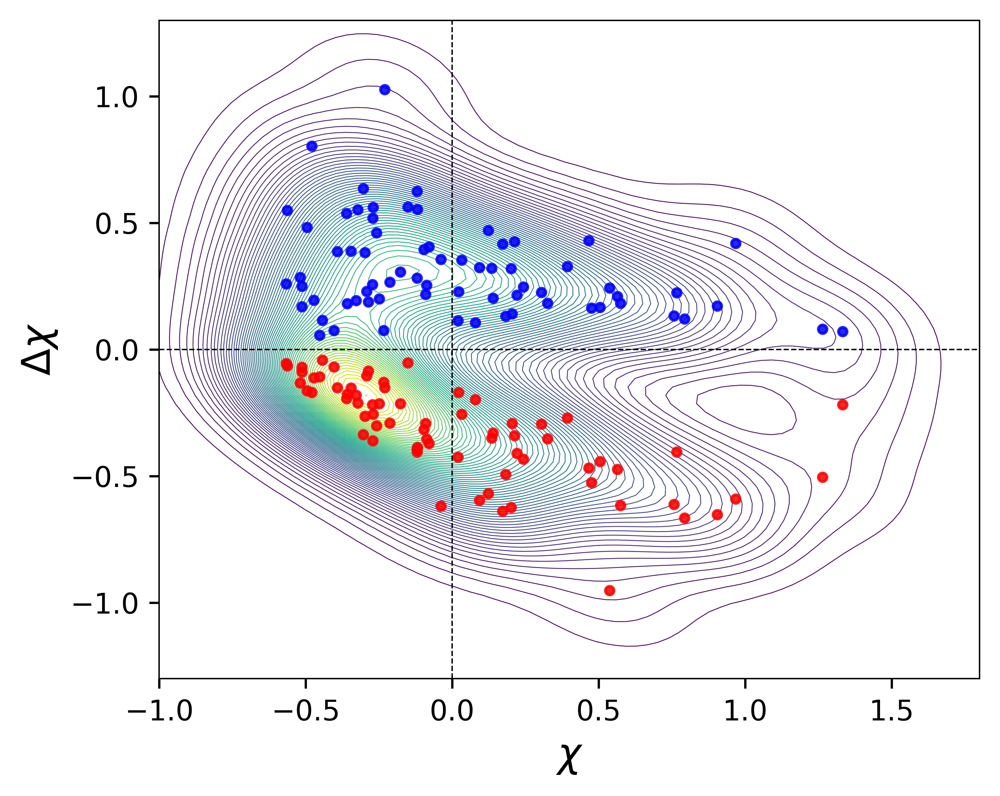

In [18]:

alpha=0.85
markersize=3
xlim=[-1, 1.8]
ylim=[-1.3, 1.3]

x_min = xlim[0]
x_max = xlim[1]
y_min = ylim[0]
y_max = ylim[1]


k = kde.gaussian_kde(data_aa.T)
xi, yi = np.mgrid[x_min:x_max:nbins*1j, y_min:y_max:nbins*1j]
zi = k(np.vstack([xi.flatten(), yi.flatten()]))


figure(num=None, figsize=(5, 4), dpi=300, facecolor='w', edgecolor='k')

ax = plt.gca()
ax.contour(xi, yi, zi.reshape(xi.shape), levels=80, linewidths=0.3)#, colors='black')

#plt.scatter(chi_local_aa, deltachi_contract, s=markersize, c='blue', alpha=alpha)
#plt.scatter(chi_local_aa, deltachi_expand, s=markersize, c='red', alpha=alpha)
 
plt.plot(chi_local_aa, deltachi_contract, 'o', markersize=markersize, c='blue', alpha=alpha)
plt.plot(chi_local_aa, deltachi_expand, 'o', markersize=markersize, c='red', alpha=alpha)
 
# define xlabel and y label

ax.set_xlabel(r'$\chi$', fontsize=14)
ax.set_ylabel(r'$\Delta \chi$',fontsize=14)

# plot dashed lines at 0,0 in both axes
plt.plot([xlim[0], xlim[1]],[0,0],'--k', linewidth=0.5)
plt.plot([0.0, 0.0], [ylim[0], ylim[1]],'--k', linewidth=0.5)


    
# set standard limits for x and y
plt.xlim([xlim[0], xlim[1]])
plt.ylim([ylim[0], ylim[1]])
plt.tight_layout()

plt.savefig('figures/FIG_4A.png')



